In [ ]:
!unzip /content/div2k.zip

Archive:  /content/div2k.zip
  inflating: DIV2K_train_HR/DIV2K_train_HR/0001.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0002.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0003.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0004.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0005.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0006.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0007.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0008.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0009.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0010.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0011.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0012.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0013.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0014.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0015.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0016.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0017.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0018.png  

In [ ]:
!unzip /content/dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: valid/valid/b/0822_6.PNG  
  inflating: valid/valid/b/0822_60.PNG  
  inflating: valid/valid/b/0822_61.PNG  
  inflating: valid/valid/b/0822_62.PNG  
  inflating: valid/valid/b/0822_63.PNG  
  inflating: valid/valid/b/0822_7.PNG  
  inflating: valid/valid/b/0822_8.PNG  
  inflating: valid/valid/b/0822_9.PNG  
  inflating: valid/valid/b/0823_0.PNG  
  inflating: valid/valid/b/0823_1.PNG  
  inflating: valid/valid/b/0823_10.PNG  
  inflating: valid/valid/b/0823_11.PNG  
  inflating: valid/valid/b/0823_12.PNG  
  inflating: valid/valid/b/0823_13.PNG  
  inflating: valid/valid/b/0823_14.PNG  
  inflating: valid/valid/b/0823_15.PNG  
  inflating: valid/valid/b/0823_16.PNG  
  inflating: valid/valid/b/0823_17.PNG  
  inflating: valid/valid/b/0823_18.PNG  
  inflating: valid/valid/b/0823_19.PNG  
  inflating: valid/valid/b/0823_2.PNG  
  inflating: valid/valid/b/0823_20.PNG  
  inflating: valid/valid/b/0823_21.PNG  
  inflating: 

In [ ]:
pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install torch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install torchvision

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install kornia

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/



This code defines a deep learning model architecture for image denoising. Here's a breakdown of the different components and what they do:

SeparableConv2d: This class implements a separable convolutional block, which consists of a depthwise convolution, batch normalization, and a pointwise convolution. It is used to reduce the number of parameters in the model while maintaining expressiveness.

Attention: This class implements an attention module, which performs self-attention on the input. It takes three inputs: query, key, and value, and computes attention weights using matrix multiplications and softmax. The attention weights are then applied to the value to obtain the attended output.

ConvAttention: This class implements a convolutional attention module, which combines convolutional operations with attention. It uses separable convolutions to process the input and applies self-attention on the processed features. It also includes operations like pixel unshuffling and shuffling for downscaling and upscaling the feature maps.

MLP: This class implements a multi-layer perceptron (MLP) module, which consists of two convolutional layers with GELU activation and dropout. It is used for non-linear transformations of the input features.

PreNorm: This class applies layer normalization to the input tensor.

Transformer: This class implements a patch-based convolutional neural network using transformer blocks. It includes pre-normalization, a convolutional attention module, and an MLP module. It applies residual connections and layer normalization within each transformer block.

ConvBlock: This class defines different convolutional blocks with various configurations, including different normalization techniques and activation functions.

PixNet: This class implements a PixelCNN-like network, which consists of convolutional layers with leaky ReLU activation. It is used for residual learning in the denoising model.

CVT: This class implements a modified version of the Convolutional Vision Transformer (CVT), which combines convolutional operations and transformer blocks for image processing. It includes an initial embedding layer followed by multiple transformer blocks.

DnCNN: This class defines the overall denoising model architecture. It includes a stack of convolutional layers followed by the CVT and PixNet modules for noise removal.

The forward methods of each class define the forward pass computations of the model. Overall, the model takes an input image and applies a series of operations to remove noise and enhance the image quality.

In [ ]:
import torch
from torch import nn
from torch.nn import functional as F
from einops.layers.torch import Rearrange

# Separable Convolutional Block
class SeparableConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, bias=True):
        super().__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size, stride, padding, groups=in_channels, bias=bias)
        self.bn = nn.BatchNorm2d(in_channels)
        self.pointwise = nn.Conv2d(in_channels, out_channels, 1, padding)

    def forward(self, x):
        x = self.depthwise(x)
        x = self.bn(x)
        x = self.pointwise(x)
        return x

# Attention module
class Attention(nn.Module):
    def __init__(self, scale):
        super().__init__()
        self.scale = scale
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        q, k, v = x
        attn = torch.einsum('b h i d, b h j d -> b h i j', q, k) * self.scale
        attn = self.softmax(attn)
        attn = torch.einsum('b h i j, b h j d -> b h i d', attn, v)
        return attn

# Convolutional Attention module
class ConvAttention(nn.Module):
    def __init__(self, in_channels, kernel_size, kv_stride, downscale_factor, heads, dim_head, dropout):
        super().__init__()
        inner_dim = dim_head * heads
        padding = kernel_size // 2
        scale = dim_head ** -0.5
        self.heads = heads
        self.downscale_factor = downscale_factor

        self.unshuffle = nn.PixelUnshuffle(downscale_factor)
        self.reduce_feature = nn.Conv2d(in_channels * (downscale_factor**2), in_channels, kernel_size, 1, padding, bias=False)

        self.to_q = SeparableConv2d(in_channels, inner_dim, kernel_size, 1, padding, bias=False)
        self.to_k = SeparableConv2d(in_channels, inner_dim, kernel_size, kv_stride, padding, bias=False)
        self.to_v = SeparableConv2d(in_channels, inner_dim, kernel_size, kv_stride, padding, bias=False)

        self.attention = Attention(scale)
        self.shuffle = nn.PixelShuffle(downscale_factor)
        self.projection = nn.Conv2d(inner_dim // (downscale_factor**2), in_channels, kernel_size, 1, padding, bias=False)
        self.do = nn.Dropout(dropout)

    def forward(self, x):
        unshuffled = self.unshuffle(x)
        reduced = self.reduce_feature(unshuffled)
        batch, channel, height, width = reduced.shape

        q = self.to_q(reduced)
        k = self.to_k(reduced)
        v = self.to_v(reduced)
        q = Rearrange('b (h d) x y -> b h (x y) d', h=self.heads)(q)
        k = Rearrange('b (h d) x y -> b h (x y) d', h=self.heads)(k)
        v = Rearrange('b (h d) x y -> b h (x y) d', h=self.heads)(v)

        attn = self.attention([q,k,v])
        attn = Rearrange('b h (x y) d -> b (h d) x y', h=self.heads, y=width)(attn)

        shuffled = self.shuffle(attn)
        projected = self.projection(shuffled)
        do = self.do(projected)
        return do

#Residual Attention module
class MLP(nn.Module):
    def __init__(self, in_channels, multipy=4, dropout=0):
        super().__init__()
        self.mlp_1 = nn.Conv2d(in_channels, in_channels*multipy, 1)
        self.gelu = nn.GELU()
        self.do_1 = nn.Dropout(dropout)
        self.mlp_2 = nn.Conv2d(in_channels*multipy, in_channels, 1)
        self.do_2 = nn.Dropout(dropout)

    def forward(self, x):
        x = self.mlp_1(x)
        x = self.gelu(x)
        x = self.do_1(x)
        x = self.mlp_2(x)
        x = self.do_2(x)
        return x


class PreNorm(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.shape
        x = Rearrange('b c h w -> b (h w) c')(x)
        x = self.norm(x)
        x = Rearrange('b (h w) c -> b c h w', h=h, w=w)(x)
        return x

#Patch-based Convolutional Neural Network
class Transformer(nn.Module):
    def __init__(self, in_channels, kernel_size, kv_stride, downscale_factor, heads, dim_head, multipy, dropout):
        super().__init__()
        self.prenorm_1 = PreNorm(in_channels)
        self.attention = ConvAttention(in_channels, kernel_size, kv_stride, downscale_factor, heads, dim_head, dropout)
        self.prenorm_2 = PreNorm(in_channels)
        self.mlp = MLP(in_channels, multipy, dropout)

    def forward(self, x):
        x_1 = self.prenorm_1(x)
        x_1 = self.attention(x_1)
        x = torch.add(x_1, x)
        x_2 = self.prenorm_2(x)
        x_2 = self.mlp(x_2)
        x = torch.add(x_2, x)
        return x

#ConvBlock
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, k, mode):
        p = k//2
        super(ConvBlock, self).__init__()
        if mode == 'no_norm':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.PReLU()
            ]
        elif mode == 'no_norm_relu':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.ReLU()
            ]
        elif mode == 'no_norm_leakyrelu':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.LeakyReLU()
            ]
        elif mode == 'no_norm_relu6':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.ReLU6()
            ]
        elif mode == 'no_norm_rrelu':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.RReLU()
            ]
        elif mode == 'normal_bn':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.BatchNorm2d(out_channels),
                nn.PReLU()
            ]
        elif mode == 'normal_bn_affine':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.BatchNorm2d(out_channels, affine=True),
                nn.PReLU()
            ]
        elif mode == 'normal_in':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.InstanceNorm2d(out_channels),
                nn.PReLU()
            ]
        elif mode == 'normal_in_affine':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.InstanceNorm2d(out_channels, affine=True),
                nn.PReLU()
            ]
        elif mode == 'preact_bn':
            layers = [
                nn.BatchNorm2d(in_channels),
                nn.PReLU(),
                nn.Conv2d(in_channels, out_channels, k, 1, p)
            ]
        elif mode == 'preact_bn_affine':
            layers = [
                nn.BatchNorm2d(in_channels, affine=True),
                nn.PReLU(),
                nn.Conv2d(in_channels, out_channels, k, 1, p),
            ]
        elif mode == 'preact_in':
            layers = [
                nn.InstanceNorm2d(in_channels),
                nn.PReLU(),
                nn.Conv2d(in_channels, out_channels, k, 1, p)
            ]
        elif mode == 'preact_in_affine':
            layers = [
                nn.InstanceNorm2d(in_channels, affine=True),
                nn.PReLU(),
                nn.Conv2d(in_channels, out_channels, k, 1, p)
            ]
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        y = self.layers(x)
        return y
#End ConvBlock

#PixCNN
class PixNet(nn.Module):
    def __init__(self, in_channels, num_feats, depth):
        super(PixNet, self).__init__()
        self.conv_in = ConvBlock(in_channels, num_feats, 3, 'no_norm_leakyrelu')
        self.conv_hid = nn.Sequential(*[ConvBlock(num_feats, num_feats, 3, 'no_norm_leakyrelu') for i in range(2)])
        self.conv_out = ConvBlock(num_feats, in_channels, 3, 'no_norm_leakyrelu')


    def forward(self, x):
        y = self.conv_in(x)
        y = self.conv_hid(y)
        y = self.conv_out(y)
        return y + x
#End PixCNN


class CVT(nn.Module):
    def __init__(self, in_channels, emb_kernel, emb_stride, depth, kernel_size, kv_stride, downscale_factor, heads, dim_head, multipy, dropout):
        super().__init__()
        self.depth = depth
        self.embedding = nn.Conv2d(in_channels, in_channels, emb_kernel, emb_stride, emb_kernel//2)
        for i in range(depth):
            self.add_module(f'transformer_{str(i)}', Transformer(in_channels, kernel_size, kv_stride, downscale_factor, heads, dim_head, multipy, dropout))

    def forward(self, x):
        x = self.embedding(x)
        for i in range(self.depth):
            x = getattr(self, f'transformer_{str(i)}')(x)
        return x


class DnCNN(nn.Module):
    def __init__(self, channels, num_of_layers=17):
        super(DnCNN, self).__init__()
        kernel_size = 3
        padding = 1
        features = 64
        layers = []
        layers.append(nn.Conv2d(in_channels=channels, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False))
        layers.append(nn.ReLU(inplace=True))
        for _ in range(num_of_layers-2):
            layers.append(nn.Conv2d(in_channels=features, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False))
            layers.append(nn.BatchNorm2d(features))
            layers.append(nn.ReLU(inplace=True))
        layers.append(nn.Conv2d(in_channels=features, out_channels=channels, kernel_size=kernel_size, padding=padding, bias=False))
        self.dncnn = nn.Sequential(*layers)
        self.cvt = nn.Sequential(nn.Conv2d(in_channels=channels, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False),
                                 CVT(in_channels=features, emb_kernel=3, emb_stride=1, depth=2, kernel_size=3, kv_stride=2, downscale_factor=4, heads=4, dim_head=8, multipy=4, dropout=0),
                                 CVT(in_channels=features, emb_kernel=3, emb_stride=1, depth=2, kernel_size=3, kv_stride=2, downscale_factor=4, heads=4, dim_head=8, multipy=4, dropout=0),
                                 nn.Conv2d(in_channels=features, out_channels=channels, kernel_size=kernel_size, padding=padding, bias=False))
        self.pixnet = PixNet(channels, 32, 2)

    def forward(self, x):
        dncnn_out = self.dncnn(x)
        mid = x - dncnn_out
        cvt_out = self.cvt(mid)
        cvt_out = cvt_out + mid
        out = self.pixnet(cvt_out)
        return out

The code defines a custom dataset class named "SNPDataset" that inherits from the torch.utils.data.Dataset class. The dataset represents a collection of images stored in a directory.

The constructor initializes the dataset by setting the paths for input (x) and target (y) images based on the provided image directory. It also retrieves the list of image filenames from the "x" path.

The __getitem__ method is implemented to fetch a specific sample from the dataset. It reads the corresponding input and target images using OpenCV's cv2.imread function. Then, it applies the transforms.ToTensor() transformation to convert the images to tensors.

The __len__ method returns the total number of image samples in the dataset, which is determined by the length of the image filenames list.

In [ ]:
import torch.utils.data as data
from torchvision import transforms
import os
import cv2


class SNPDataset(data.Dataset):
    def __init__(self, image_dir):
        super(SNPDataset, self).__init__()
        self.x_path = os.path.join(image_dir, 'b')
        self.y_path = os.path.join(image_dir, 'a')

        self.image_filenames = [file_name for file_name in os.listdir(self.x_path)]

    def __getitem__(self, index):
        x = cv2.imread(os.path.join(self.x_path, self.image_filenames[index]), 0)
        y = cv2.imread(os.path.join(self.y_path, self.image_filenames[index]), 0)

        ##tambahan SWT

        x = transforms.ToTensor()(x)
        y = transforms.ToTensor()(y)

        return x, y

    def __len__(self):
        return len(self.image_filenames)

The code provided seems to be a training loop for a neural network model. It includes functions for calculating the Peak Signal-to-Noise Ratio (PSNR) and training/validation steps.

Here's a breakdown of the code:

Importing necessary libraries:

from statistics import mean: Imports the mean function from the statistics module, which is used to calculate the average of a list of values.
from tqdm import tqdm: Imports the tqdm library, which provides a progress bar for loops.
Defining the PSNR function:

The psnr function calculates the PSNR between a clean image and a noisy image.
It takes the clean and noisy images as inputs, along with the maximum pixel value (defaulted to 255.0) and a flag on_gpu indicating whether the calculations should be performed on the GPU.
The function converts the input images to NumPy arrays, computes the Mean Squared Error (MSE) between the clean and noisy images, and then calculates the PSNR using the MSE and the maximum pixel value.
Defining the training step function:

The train_step function performs a single training step for a batch of data.
It takes a batch of input data (x) and corresponding target data (y) as inputs.
It initializes the gradients to zero, passes the input data through the network (net) to obtain the output, calculates the loss between the output and target, and performs backpropagation to update the network weights.
It also calculates the PSNR between the target and output images.
The loss and PSNR values are appended to the respective lists (train_loss_list and train_psnr_list).
The function returns the loss and PSNR values as floats.
Defining the validation step function:

The validation_step function performs a single validation step for a batch of data.
It takes a batch of input data (x) and corresponding target data (y) as inputs.
It passes the input data through the network to obtain the output and calculates the loss and PSNR between the output and target images.
The loss and PSNR values are appended to the respective lists (val_loss_list and val_psnr_list).
The function returns the loss and PSNR values as floats.
Defining the training function:

The train function trains the neural network model for a specified number of epochs.
It initializes an empty dictionary history to store the training/validation loss and PSNR values.
It iterates over the epochs and performs the following steps:
Initializes empty lists to store the loss and PSNR values for each training and validation batch.
Sets the network to training mode (net.train()) and initializes a progress bar for the training data loader.
Iterates over the training batches and performs the training step for each batch.
Calculates the average loss and PSNR values for the training data and updates the progress bar.
Sets the network to evaluation mode (net.eval()) and initializes a progress bar for the validation data loader.
Iterates over the validation batches and performs the validation step for each batch.
Calculates the average loss and PSNR values for the validation data and updates the progress bar.
Appends the average loss and PSNR values to the history dictionary.
Adjusts the learning rate using a scheduler (scheduler.step()).
Returns the history dictionary, which contains the training and validation loss and PSNR values for each epoch.

Note: The code assumes that there are variables defined outside these functions, such as device (specifying the device for computations, e.g., 'cuda' for GPU or 'cpu' for CPU), optimizer (the optimizer used for updating the network parameters), loss (the loss function), training_data_loader (the data loader for training data), and validation_data_loader (the data loader for validation data).

In [ ]:
from statistics import mean
from tqdm import tqdm
import numpy as np

def psnr(clean, noisy, max_value=255.0, on_gpu=True):
    if on_gpu:
        np_ground = np.array(clean.cpu().detach().numpy(), dtype='float')
        np_compressed = np.array(noisy.cpu().detach().numpy(), dtype='float')
    else:
        np_ground = np.array(clean, dtype='float')
        np_compressed = np.array(noisy, dtype='float')
    mse = np.mean((np_ground - np_compressed)**2)
    psnr = np.log10(max_value**2/mse) * 10
    return psnr


def train_step(batch, train_loss_list, train_psnr_list):
    x, y = batch[0].to(device), batch[1].to(device)
    optimizer.zero_grad()
    output = net(x)

    loss_val = loss(output, y)
    loss_val.backward()
    optimizer.step()

    psnr_val = psnr(y, output, max_value=1.0)

    train_loss_list.append(float(loss_val.item()))
    train_psnr_list.append(psnr_val)

    return loss_val.item(), psnr_val


def validation_step(batch, val_loss_list, val_psnr_list):
    x, y = batch[0].to(device), batch[1].to(device)
    output = net(x)

    loss_val = loss(output, y)
    psnr_val = psnr(y, output, max_value=1.0)

    val_loss_list.append(float(loss_val.item()))
    val_psnr_list.append(psnr_val)

    return loss_val.item(), psnr_val


def train(epochs=100):
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_psnr': [],
        'val_psnr': [],
    }

    for epoch in range(epochs):
        train_loss_list = []
        val_loss_list = []
        train_psnr_list = []
        val_psnr_list = []

        net.train()
        with tqdm(training_data_loader, unit='batch') as t_train:
            t_train.set_description(f"Epoch {epoch+1}\t TRAIN")
            for i, batch in enumerate(t_train):
                loss_train, psnr_train = train_step(batch, train_loss_list, train_psnr_list)
                t_train.set_postfix(train_loss=loss_train, train_psnr=psnr_train)
            train_loss_avg = mean(train_loss_list)
            train_psnr_avg = mean(train_psnr_list)
            t_train.set_postfix(train_loss=train_loss_avg, train_psnr=train_psnr_avg)

        net.eval()
        with tqdm(validation_data_loader, unit='batch') as t_val:
            t_val.set_description(f"Epoch {epoch+1}\t VALID")
            for i, batch in enumerate(t_val):
                loss_val, psnr_val = validation_step(batch, val_loss_list, val_psnr_list)
                t_val.set_postfix(val_loss=loss_val, val_psnr=psnr_val)
            val_loss_avg = mean(val_loss_list)
            val_psnr_avg = mean(val_psnr_list)
            t_val.set_postfix(val_loss=val_loss_avg, val_psnr=val_psnr_avg)

        history['train_loss'].append(train_loss_avg)
        history['val_loss'].append(val_loss_avg)
        history['train_psnr'].append(train_psnr_avg)
        history['val_psnr'].append(val_psnr_avg)

        scheduler.step()

    return history

In [ ]:
train_base_path = '/content/DIV2K_train_HR/DIV2K_train_HR'
valid_base_path = '/content/DIV2K_valid_HR/DIV2K_valid_HR'
train_target_path = '/content/train/train'
valid_target_path = '/content/valid/valid'

In [ ]:
import torch
from torch.utils.data import DataLoader
import os
import kornia

torch.cuda.manual_seed(100)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_set = SNPDataset(train_target_path)
training_data_loader = DataLoader(dataset=train_set, num_workers=2, batch_size=32, shuffle=True)

validation_set = SNPDataset(valid_target_path)
validation_data_loader = DataLoader(dataset=validation_set, num_workers=2, batch_size=32, shuffle=True)

net = nn.DataParallel(DnCNN(1)).to(device)

loss = nn.MSELoss().to(device) #nn.L1Loss().to(device)
optimizer = torch.optim.Adam(net.parameters() ,lr=0.0005)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.5)


The  code provided sets up the necessary components for training the neural network model. Here's a breakdown of the code:

Importing necessary libraries:

import torch: Imports the PyTorch library.
from torch.utils.data import DataLoader: Imports the DataLoader class from torch.utils.data module, which helps in loading the data in batches during training.
import os: Imports the os module for operating system-related functionalities.
import kornia: Imports the kornia library, which provides computer vision functions for PyTorch.
Setting the random seed and device:

torch.cuda.manual_seed(100): Sets the random seed for CUDA operations to ensure reproducibility if using a GPU.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'): Sets the device to 'cuda' if a GPU is available, otherwise sets it to 'cpu'.
Creating data loaders for training and validation data:

train_set = SNPDataset(train_target_path): Initializes a dataset (SNPDataset) with the training target path. You may need to define the SNPDataset class separately to match your dataset structure.
training_data_loader = DataLoader(dataset=train_set, num_workers=2, batch_size=32, shuffle=True): Creates a data loader (training_data_loader) for the training dataset. It loads the data in batches of size 32, shuffles the data, and uses 2 worker processes for data loading.
validation_set = SNPDataset(valid_target_path): Initializes a dataset (SNPDataset) with the validation target path. Again, you may need to define the SNPDataset class separately.
validation_data_loader = DataLoader(dataset=validation_set, num_workers=2, batch_size=32, shuffle=True): Creates a data loader (validation_data_loader) for the validation dataset. It loads the data in batches of size 32, shuffles the data, and uses 2 worker processes for data loading.
Creating the network model:

net = nn.DataParallel(DnCNN(1)).to(device): Creates the network model (DnCNN(1)) and wraps it with DataParallel to enable multi-GPU training if available. The model is then moved to the specified device (GPU or CPU) using to(device).
Defining the loss function and optimizer:

loss = nn.MSELoss().to(device): Defines the mean squared error (MSE) loss function (nn.MSELoss()) and moves it to the specified device using to(device). You can uncomment the line #nn.L1Loss().to(device) and comment out the MSE loss if you want to use the L1 loss instead.
optimizer = torch.optim.Adam(net.parameters(), lr=0.0005): Initializes the Adam optimizer (torch.optim.Adam) with the network parameters (net.parameters()) and a learning rate of 0.0005.
Setting up the learning rate scheduler:

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.5): Creates a learning rate scheduler (torch.optim.lr_scheduler.StepLR) that decreases the learning rate by a factor of 0.5 every 2 epochs. This helps in adjusting the learning rate during training.


In [ ]:
device

device(type='cuda')

In [ ]:
history = train(5) #training

Epoch 5	 VALID: 100%|██████████| 200/200 [00:21<00:00,  9.31batch/s, val_loss=0.000506, val_psnr=33]


In [ ]:
torch.save(net, 'best-model.pt')
torch.save(net.state_dict(), 'best-model-parameters.pt')


The code torch.save(net, 'best-model.pt') saves the entire model net as a file named 'best-model.pt'. This file will include the model architecture, parameters, and other relevant information. It allows to save the complete state of the model for later use.

The code torch.save(net.state_dict(), 'best-model-parameters.pt') saves only the state dictionary of the model net as a file named 'best-model-parameters.pt'. The state dictionary contains only the learnable parameters of the model, excluding the model architecture. Saving the model parameters separately can be useful when want to load the parameters into a model with the same architecture or a different model altogether.

Both of these functions (torch.save) are part of the PyTorch library and provide convenient ways to save and load models during training and inference.

In [ ]:
import pandas as pd

df = pd.DataFrame(history)
df.to_csv('history.csv')
df

,train_loss,val_loss,train_psnr,val_psnr
0,0.002141,0.000578,30.512136,32.520647
1,0.000535,0.000539,32.962687,32.820274
2,0.000442,0.000492,33.788875,33.228106
3,0.000443,0.000458,33.763961,33.552264
4,0.000400,0.000462,34.235739,33.509705


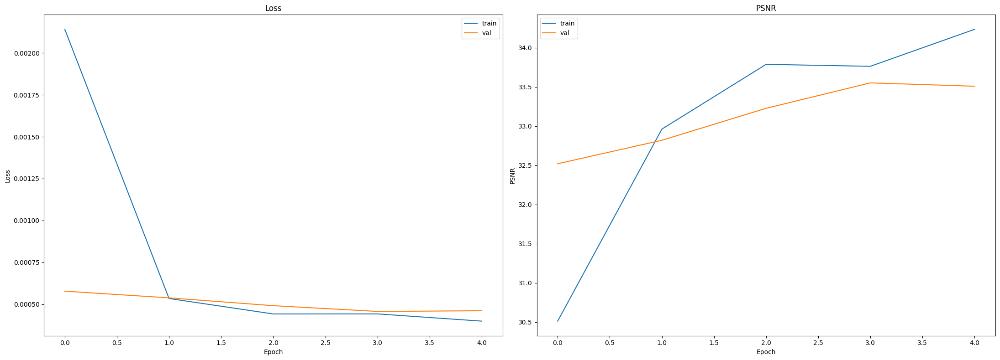

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(22, 8))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'])
plt.plot(history['val_loss'])
plt.title('Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'])

plt.subplot(1, 2, 2)
plt.plot(history['train_psnr'])
plt.plot(history['val_psnr'])
plt.title('PSNR')
plt.ylabel('PSNR')
plt.xlabel('Epoch')
plt.legend(['train', 'val'])

plt.tight_layout()
plt.show()

In [ ]:
import random
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset

import cv2
import argparse
import os
import numpy as np

import cv2 as cv

from math import floor
from PIL import Image
from tqdm import tqdm
import torch
from torchvision import transforms
import random

def apply_threshold(value):
    "Returns 0 or 255 depending where value is closer"
    return 255 * floor(value/128)


def add_noise(image, noise_level):
    image = Image.fromarray(image)
    image = image.convert('RGB')
    image = image.resize((512, 512))  # Resize the image to the desired size
    pixel = image.load()

    x_lim, y_lim = image.size

    for y in range(1, y_lim):
        for x in range(1, x_lim):
            red_oldpixel, green_oldpixel, blue_oldpixel = pixel[x, y]

            red_newpixel = apply_threshold(red_oldpixel)
            green_newpixel = apply_threshold(green_oldpixel)
            blue_newpixel = apply_threshold(blue_oldpixel)

            pixel[x, y] = red_newpixel, green_newpixel, blue_newpixel

            red_error = red_oldpixel - red_newpixel
            blue_error = blue_oldpixel - blue_newpixel
            green_error = green_oldpixel - green_newpixel

            if x < x_lim - 1:
                red = pixel[x+1, y][0] + round(red_error * 7/16)
                green = pixel[x+1, y][1] + round(green_error * 7/16)
                blue = pixel[x+1, y][2] + round(blue_error * 7/16)

                pixel[x+1, y] = (red, green, blue)

            if x > 1 and y < y_lim - 1:
                red = pixel[x-1, y+1][0] + round(red_error * 3/16)
                green = pixel[x-1, y+1][1] + round(green_error * 3/16)
                blue = pixel[x-1, y+1][2] + round(blue_error * 3/16)

                pixel[x-1, y+1] = (red, green, blue)

            if y < y_lim - 1:
                red = pixel[x, y+1][0] + round(red_error * 5/16)
                green = pixel[x, y+1][1] + round(green_error * 5/16)
                blue = pixel[x, y+1][2] + round(blue_error * 5/16)

                pixel[x, y+1] = (red, green, blue)

            if x < x_lim - 1 and y < y_lim - 1:
                red = pixel[x+1, y+1][0] + round(red_error * 1/16)
                green = pixel[x+1, y+1][1] + round(green_error * 1/16)
                blue = pixel[x+1, y+1][2] + round(blue_error * 1/16)

                pixel[x+1, y+1] = (red, green, blue)

    return np.array(image)


def denoise_rgb(image, model):
    image = image.copy()
    image = np.array(image)
    image = np.moveaxis(image, -1, 0)
    for i in range(3):
        image_tensor = image[i,:,:]
        image_tensor = transforms.ToTensor()(image_tensor).expand(1, 1, image_size, image_size).to(device)
        denoised = model(image_tensor)
        denoised = denoised.cpu().detach().numpy() * 255.0
        image[i,:,:] = np.squeeze(denoised, axis=0)
    image = np.moveaxis(image, 0, -1)
    image = np.clip(image, 0.0, 255.0).astype('uint8')
    return image


def imshow(img):
    import cv2
    import IPython
    import numpy as np
    _,ret = cv2.imencode('.png', cv2.cvtColor(np.array(img), cv2.COLOR_BGR2RGB))
    i = IPython.display.Image(data=ret)
    IPython.display.display(i)


def prep_denoise(path, model):
    image = cv2.imread(path, 1)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (image_size, image_size))

    noisy = add_noise(image, amount)

    denoised = denoise_rgb(noisy, model)

    return image, noisy, denoised


def test(amount, model, path):
    net.eval()
    image_path = path
    images = prep_denoise(image_path, model)

    fig, axes = plt.subplots(1, len(images), figsize=(25, 5))

    cols = ['Ground Truth', 'Halftoned', 'Inversed']

    for j, image in enumerate(images):
        axes[j].imshow(image)
        axins = zoomed_inset_axes(axes[j], 3, loc=1)
        axins.imshow(image, interpolation="nearest", origin="lower")
        x1, x2, y1, y2 = 200, 250, 250, 200
        axins.set_xlim(x1, x2)
        axins.set_ylim(y1, y2)
        axins.set_xticks([])
        axins.set_yticks([])
        mark_inset(axes[j], axins, loc1=2, loc2=4, fc="none", ec="0.5")
        if j != 0:
            axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255),ssim(images[0], image, data_range=255, multichannel=True)))
        axes[j].set_xticks([])
        axes[j].set_yticks([])

    pad = 5
    for ax, col in zip(axes, cols):
        ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                    xycoords='axes fraction', textcoords='offset points',
                    size='large', ha='center', va='baseline')

    fig.tight_layout()



The code provided is a script for testing denoising algorithms on images. It includes functions for adding noise to an image, denoising the image using a trained model, and visualizing the results.

Here's a breakdown of the code:

The apply_threshold function is used to convert pixel values to either 0 or 255 based on a threshold.
The add_noise function takes an image and a noise level as input and adds noise to the image using the Floyd-Steinberg dithering algorithm. This function modifies the image in-place and returns the modified image.
The denoise_rgb function takes a noisy image and a denoising model as input and denoises the image using the model. It converts the image to a tensor, passes it through the model, and converts the output back to an image. The function returns the denoised image.
The imshow function is a helper function for displaying images using matplotlib.
The prep_denoise function prepares an image for denoising by resizing it and adding noise.
The test function takes a noise level, a denoising model, and a path to a directory containing test images. It iterates over the images, prepares them for denoising, and visualizes the ground truth, noisy, and denoised images using matplotlib.
To use this code, we need to have a trained denoising model (model) and a directory containing test images (path). You can then call the test function to visualize the denoising results.


In [ ]:
net = torch.load('/content/best-model.pt')

In [ ]:
torch.save(net,'model.h5')

In [ ]:
torch.save(net,'model.hdf5')

<ipython-input-50-ff3f4d5eb383>:135: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255),ssim(images[0], image, data_range=255, multichannel=True)))
<ipython-input-50-ff3f4d5eb383>:145: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


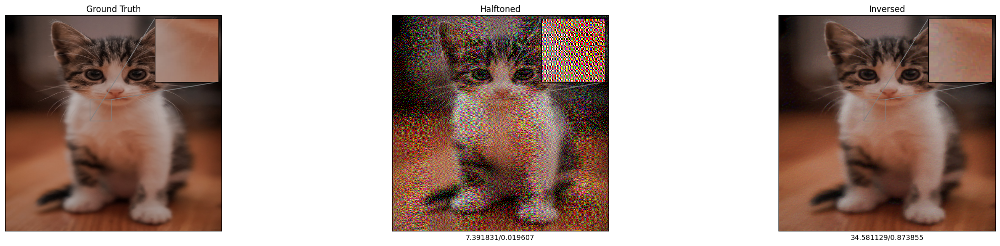

In [ ]:
image_size = 512
amount = 0.7

test(amount, net, '/content/photo-1615789591457-74a63395c990.jpeg')

<ipython-input-50-ff3f4d5eb383>:135: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255),ssim(images[0], image, data_range=255, multichannel=True)))
<ipython-input-50-ff3f4d5eb383>:145: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


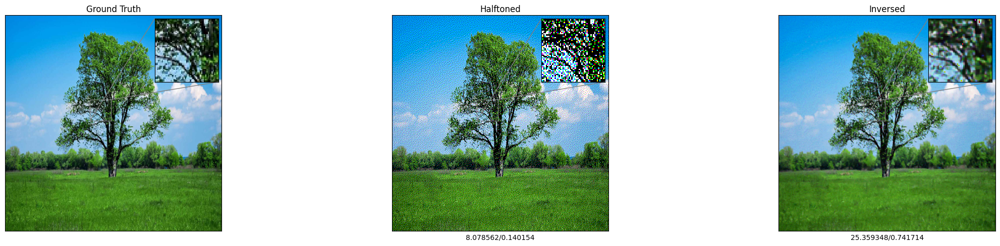

In [ ]:
image_size = 512
amount = 0.7

test(amount, net, '/content/the-difference-between-trees-and-shrubs-3269804-hero-a4000090f0714f59a8ec6201ad250d90.jpg')

<ipython-input-32-ff3f4d5eb383>:135: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255),ssim(images[0], image, data_range=255, multichannel=True)))
<ipython-input-32-ff3f4d5eb383>:145: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


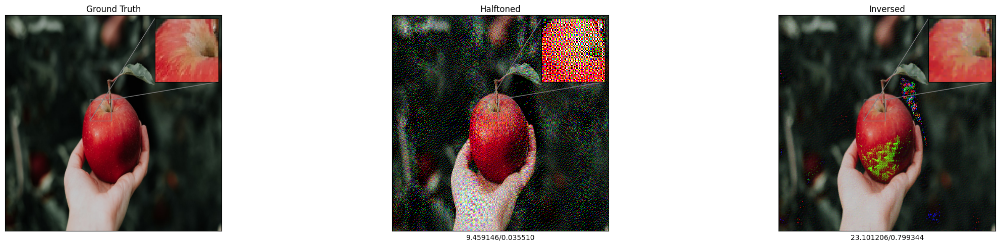

In [ ]:
image_size = 512
amount = 0.7

test(amount, net, '/content/photo-1570913149827-d2ac84ab3f9a.jpeg')

FileUpload(value={}, accept='image/*', description='Upload')

Button(description='Process Image', style=ButtonStyle())

<ipython-input-35-1db98f7dede8>:39: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255), ssim(images[0], image, data_range=255, multichannel=True)))
<ipython-input-35-1db98f7dede8>:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


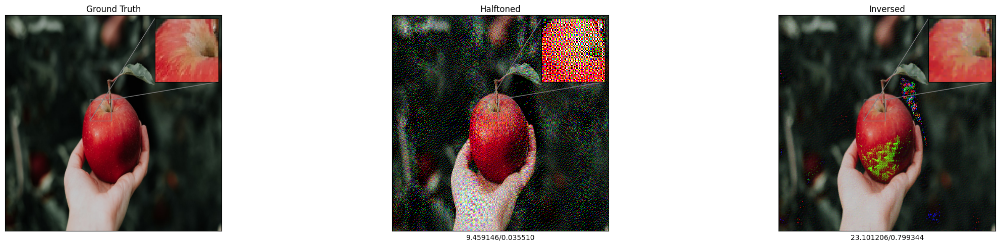

In [ ]:
from google.colab import files
import ipywidgets as widgets
from IPython.display import display

# Create a file uploader widget
uploader = widgets.FileUpload(accept='image/*')

# Create a button widget
button = widgets.Button(description='Process Image')

def on_button_clicked(b):
    # Get the uploaded image file
    image_file = uploader.data[-1]

    # Save the image file
    with open('uploaded_image.jpg', 'wb') as f:
        f.write(image_file)

    # Process the uploaded image
    image_path = 'uploaded_image.jpg'
    images = prep_denoise(image_path, net)

    # Display the results
    fig, axes = plt.subplots(1, len(images), figsize=(25, 5))

    cols = ['Ground Truth', 'Halftoned', 'Inversed']

    for j, image in enumerate(images):
        axes[j].imshow(image)
        axins = zoomed_inset_axes(axes[j], 3, loc=1)
        axins.imshow(image, interpolation="nearest", origin="lower")
        x1, x2, y1, y2 = 200, 250, 250, 200
        axins.set_xlim(x1, x2)
        axins.set_ylim(y1, y2)
        axins.set_xticks([])
        axins.set_yticks([])
        mark_inset(axes[j], axins, loc1=2, loc2=4, fc="none", ec="0.5")
        if j != 0:
            axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255), ssim(images[0], image, data_range=255, multichannel=True)))
        axes[j].set_xticks([])
        axes[j].set_yticks([])

    pad = 5
    for ax, col in zip(axes, cols):
        ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                    xycoords='axes fraction', textcoords='offset points',
                    size='large', ha='center', va='baseline')

    fig.tight_layout()

# Register the button click event
button.on_click(on_button_clicked)

# Display the widgets
display(uploader)
display(button)


<ipython-input-37-316a66db1e5c>:42: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255), ssim(images[0], image, data_range=255, multichannel=True)))
<ipython-input-37-316a66db1e5c>:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


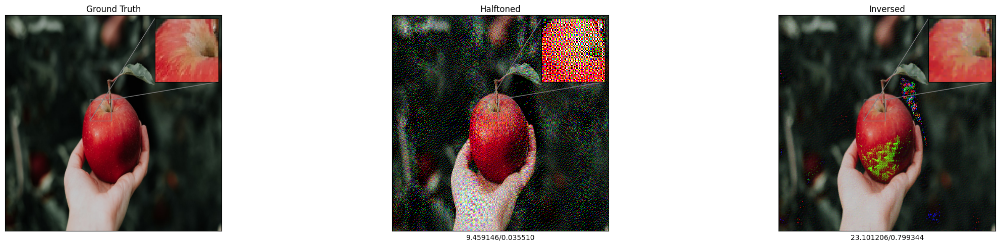

In [ ]:
from google.colab import files
import ipywidgets as widgets
from IPython.display import display, clear_output

# Create a file uploader widget
uploader = widgets.FileUpload(accept='image/*')

# Create a button widget
button = widgets.Button(description='Process Image')

def on_button_clicked(b):
    # Get the uploaded image file
    image_file = uploader.data[-1]

    # Save the image file
    with open('uploaded_image.jpg', 'wb') as f:
        f.write(image_file)

    # Process the uploaded image
    image_path = 'uploaded_image.jpg'
    images = prep_denoise(image_path, net)

    # Clear previous output
    clear_output()

    # Display the results
    fig, axes = plt.subplots(1, len(images), figsize=(25, 5))

    cols = ['Ground Truth', 'Halftoned', 'Inversed']

    for j, image in enumerate(images):
        axes[j].imshow(image)
        axins = zoomed_inset_axes(axes[j], 3, loc=1)
        axins.imshow(image, interpolation="nearest", origin="lower")
        x1, x2, y1, y2 = 200, 250, 250, 200
        axins.set_xlim(x1, x2)
        axins.set_ylim(y1, y2)
        axins.set_xticks([])
        axins.set_yticks([])
        mark_inset(axes[j], axins, loc1=2, loc2=4, fc="none", ec="0.5")
        if j != 0:
            axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255), ssim(images[0], image, data_range=255, multichannel=True)))
        axes[j].set_xticks([])
        axes[j].set_yticks([])

    pad = 5
    for ax, col in zip(axes, cols):
        ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                    xycoords='axes fraction', textcoords='offset points',
                    size='large', ha='center', va='baseline')

    fig.tight_layout()

    # Display the results in a new output area
    with out:
        clear_output()
        display(fig)

# Register the button click event
button.on_click(on_button_clicked)

# Create an output widget for displaying the results
out = widgets.Output()

# Display the widgets
display(uploader)
display(button)
display(out)


# Without training

In [1]:
pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.6 MB/s eta 0:00:00


In [2]:
pip install torch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
pip install torchvision

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
pip install kornia

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 653.4/653.4 kB 33.7 MB/s eta 0:00:00


In [6]:
import torch
from torchvision.transforms import ToTensor
from PIL import Image
from io import BytesIO
import IPython.display as display
import ipywidgets as widgets

In [7]:
import torch
from torch import nn
from torch.nn import functional as F
from einops.layers.torch import Rearrange

# Separable Convolutional Block
class SeparableConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, bias=True):
        super().__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size, stride, padding, groups=in_channels, bias=bias)
        self.bn = nn.BatchNorm2d(in_channels)
        self.pointwise = nn.Conv2d(in_channels, out_channels, 1, padding)

    def forward(self, x):
        x = self.depthwise(x)
        x = self.bn(x)
        x = self.pointwise(x)
        return x

# Attention module
class Attention(nn.Module):
    def __init__(self, scale):
        super().__init__()
        self.scale = scale
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        q, k, v = x
        attn = torch.einsum('b h i d, b h j d -> b h i j', q, k) * self.scale
        attn = self.softmax(attn)
        attn = torch.einsum('b h i j, b h j d -> b h i d', attn, v)
        return attn

# Convolutional Attention module
class ConvAttention(nn.Module):
    def __init__(self, in_channels, kernel_size, kv_stride, downscale_factor, heads, dim_head, dropout):
        super().__init__()
        inner_dim = dim_head * heads
        padding = kernel_size // 2
        scale = dim_head ** -0.5
        self.heads = heads
        self.downscale_factor = downscale_factor

        self.unshuffle = nn.PixelUnshuffle(downscale_factor)
        self.reduce_feature = nn.Conv2d(in_channels * (downscale_factor**2), in_channels, kernel_size, 1, padding, bias=False)

        self.to_q = SeparableConv2d(in_channels, inner_dim, kernel_size, 1, padding, bias=False)
        self.to_k = SeparableConv2d(in_channels, inner_dim, kernel_size, kv_stride, padding, bias=False)
        self.to_v = SeparableConv2d(in_channels, inner_dim, kernel_size, kv_stride, padding, bias=False)

        self.attention = Attention(scale)
        self.shuffle = nn.PixelShuffle(downscale_factor)
        self.projection = nn.Conv2d(inner_dim // (downscale_factor**2), in_channels, kernel_size, 1, padding, bias=False)
        self.do = nn.Dropout(dropout)

    def forward(self, x):
        unshuffled = self.unshuffle(x)
        reduced = self.reduce_feature(unshuffled)
        batch, channel, height, width = reduced.shape

        q = self.to_q(reduced)
        k = self.to_k(reduced)
        v = self.to_v(reduced)
        q = Rearrange('b (h d) x y -> b h (x y) d', h=self.heads)(q)
        k = Rearrange('b (h d) x y -> b h (x y) d', h=self.heads)(k)
        v = Rearrange('b (h d) x y -> b h (x y) d', h=self.heads)(v)

        attn = self.attention([q,k,v])
        attn = Rearrange('b h (x y) d -> b (h d) x y', h=self.heads, y=width)(attn)

        shuffled = self.shuffle(attn)
        projected = self.projection(shuffled)
        do = self.do(projected)
        return do

#Residual Attention module
class MLP(nn.Module):
    def __init__(self, in_channels, multipy=4, dropout=0):
        super().__init__()
        self.mlp_1 = nn.Conv2d(in_channels, in_channels*multipy, 1)
        self.gelu = nn.GELU()
        self.do_1 = nn.Dropout(dropout)
        self.mlp_2 = nn.Conv2d(in_channels*multipy, in_channels, 1)
        self.do_2 = nn.Dropout(dropout)

    def forward(self, x):
        x = self.mlp_1(x)
        x = self.gelu(x)
        x = self.do_1(x)
        x = self.mlp_2(x)
        x = self.do_2(x)
        return x


class PreNorm(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.shape
        x = Rearrange('b c h w -> b (h w) c')(x)
        x = self.norm(x)
        x = Rearrange('b (h w) c -> b c h w', h=h, w=w)(x)
        return x

#Patch-based Convolutional Neural Network
class Transformer(nn.Module):
    def __init__(self, in_channels, kernel_size, kv_stride, downscale_factor, heads, dim_head, multipy, dropout):
        super().__init__()
        self.prenorm_1 = PreNorm(in_channels)
        self.attention = ConvAttention(in_channels, kernel_size, kv_stride, downscale_factor, heads, dim_head, dropout)
        self.prenorm_2 = PreNorm(in_channels)
        self.mlp = MLP(in_channels, multipy, dropout)

    def forward(self, x):
        x_1 = self.prenorm_1(x)
        x_1 = self.attention(x_1)
        x = torch.add(x_1, x)
        x_2 = self.prenorm_2(x)
        x_2 = self.mlp(x_2)
        x = torch.add(x_2, x)
        return x

#ConvBlock
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, k, mode):
        p = k//2
        super(ConvBlock, self).__init__()
        if mode == 'no_norm':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.PReLU()
            ]
        elif mode == 'no_norm_relu':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.ReLU()
            ]
        elif mode == 'no_norm_leakyrelu':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.LeakyReLU()
            ]
        elif mode == 'no_norm_relu6':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.ReLU6()
            ]
        elif mode == 'no_norm_rrelu':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.RReLU()
            ]
        elif mode == 'normal_bn':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.BatchNorm2d(out_channels),
                nn.PReLU()
            ]
        elif mode == 'normal_bn_affine':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.BatchNorm2d(out_channels, affine=True),
                nn.PReLU()
            ]
        elif mode == 'normal_in':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.InstanceNorm2d(out_channels),
                nn.PReLU()
            ]
        elif mode == 'normal_in_affine':
            layers = [
                nn.Conv2d(in_channels, out_channels, k, 1, p),
                nn.InstanceNorm2d(out_channels, affine=True),
                nn.PReLU()
            ]
        elif mode == 'preact_bn':
            layers = [
                nn.BatchNorm2d(in_channels),
                nn.PReLU(),
                nn.Conv2d(in_channels, out_channels, k, 1, p)
            ]
        elif mode == 'preact_bn_affine':
            layers = [
                nn.BatchNorm2d(in_channels, affine=True),
                nn.PReLU(),
                nn.Conv2d(in_channels, out_channels, k, 1, p),
            ]
        elif mode == 'preact_in':
            layers = [
                nn.InstanceNorm2d(in_channels),
                nn.PReLU(),
                nn.Conv2d(in_channels, out_channels, k, 1, p)
            ]
        elif mode == 'preact_in_affine':
            layers = [
                nn.InstanceNorm2d(in_channels, affine=True),
                nn.PReLU(),
                nn.Conv2d(in_channels, out_channels, k, 1, p)
            ]
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        y = self.layers(x)
        return y
#End ConvBlock

#PixCNN
class PixNet(nn.Module):
    def __init__(self, in_channels, num_feats, depth):
        super(PixNet, self).__init__()
        self.conv_in = ConvBlock(in_channels, num_feats, 3, 'no_norm_leakyrelu')
        self.conv_hid = nn.Sequential(*[ConvBlock(num_feats, num_feats, 3, 'no_norm_leakyrelu') for i in range(2)])
        self.conv_out = ConvBlock(num_feats, in_channels, 3, 'no_norm_leakyrelu')


    def forward(self, x):
        y = self.conv_in(x)
        y = self.conv_hid(y)
        y = self.conv_out(y)
        return y + x
#End PixCNN


class CVT(nn.Module):
    def __init__(self, in_channels, emb_kernel, emb_stride, depth, kernel_size, kv_stride, downscale_factor, heads, dim_head, multipy, dropout):
        super().__init__()
        self.depth = depth
        self.embedding = nn.Conv2d(in_channels, in_channels, emb_kernel, emb_stride, emb_kernel//2)
        for i in range(depth):
            self.add_module(f'transformer_{str(i)}', Transformer(in_channels, kernel_size, kv_stride, downscale_factor, heads, dim_head, multipy, dropout))

    def forward(self, x):
        x = self.embedding(x)
        for i in range(self.depth):
            x = getattr(self, f'transformer_{str(i)}')(x)
        return x


class DnCNN(nn.Module):
    def __init__(self, channels, num_of_layers=17):
        super(DnCNN, self).__init__()
        kernel_size = 3
        padding = 1
        features = 64
        layers = []
        layers.append(nn.Conv2d(in_channels=channels, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False))
        layers.append(nn.ReLU(inplace=True))
        for _ in range(num_of_layers-2):
            layers.append(nn.Conv2d(in_channels=features, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False))
            layers.append(nn.BatchNorm2d(features))
            layers.append(nn.ReLU(inplace=True))
        layers.append(nn.Conv2d(in_channels=features, out_channels=channels, kernel_size=kernel_size, padding=padding, bias=False))
        self.dncnn = nn.Sequential(*layers)
        self.cvt = nn.Sequential(nn.Conv2d(in_channels=channels, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False),
                                 CVT(in_channels=features, emb_kernel=3, emb_stride=1, depth=2, kernel_size=3, kv_stride=2, downscale_factor=4, heads=4, dim_head=8, multipy=4, dropout=0),
                                 CVT(in_channels=features, emb_kernel=3, emb_stride=1, depth=2, kernel_size=3, kv_stride=2, downscale_factor=4, heads=4, dim_head=8, multipy=4, dropout=0),
                                 nn.Conv2d(in_channels=features, out_channels=channels, kernel_size=kernel_size, padding=padding, bias=False))
        self.pixnet = PixNet(channels, 32, 2)

    def forward(self, x):
        dncnn_out = self.dncnn(x)
        mid = x - dncnn_out
        cvt_out = self.cvt(mid)
        cvt_out = cvt_out + mid
        out = self.pixnet(cvt_out)
        return out

In [8]:
import torch.utils.data as data
from torchvision import transforms
import os
import cv2


class SNPDataset(data.Dataset):
    def __init__(self, image_dir):
        super(SNPDataset, self).__init__()
        self.x_path = os.path.join(image_dir, 'b')
        self.y_path = os.path.join(image_dir, 'a')

        self.image_filenames = [file_name for file_name in os.listdir(self.x_path)]

    def __getitem__(self, index):
        x = cv2.imread(os.path.join(self.x_path, self.image_filenames[index]), 0)
        y = cv2.imread(os.path.join(self.y_path, self.image_filenames[index]), 0)

        ##tambahan SWT

        x = transforms.ToTensor()(x)
        y = transforms.ToTensor()(y)

        return x, y

    def __len__(self):
        return len(self.image_filenames)

In [9]:
from statistics import mean
from tqdm import tqdm
import numpy as np

def psnr(clean, noisy, max_value=255.0, on_gpu=True):
    if on_gpu:
        np_ground = np.array(clean.cpu().detach().numpy(), dtype='float')
        np_compressed = np.array(noisy.cpu().detach().numpy(), dtype='float')
    else:
        np_ground = np.array(clean, dtype='float')
        np_compressed = np.array(noisy, dtype='float')
    mse = np.mean((np_ground - np_compressed)**2)
    psnr = np.log10(max_value**2/mse) * 10
    return psnr


def train_step(batch, train_loss_list, train_psnr_list):
    x, y = batch[0].to(device), batch[1].to(device)
    optimizer.zero_grad()
    output = net(x)

    loss_val = loss(output, y)
    loss_val.backward()
    optimizer.step()

    psnr_val = psnr(y, output, max_value=1.0)

    train_loss_list.append(float(loss_val.item()))
    train_psnr_list.append(psnr_val)

    return loss_val.item(), psnr_val


def validation_step(batch, val_loss_list, val_psnr_list):
    x, y = batch[0].to(device), batch[1].to(device)
    output = net(x)

    loss_val = loss(output, y)
    psnr_val = psnr(y, output, max_value=1.0)

    val_loss_list.append(float(loss_val.item()))
    val_psnr_list.append(psnr_val)

    return loss_val.item(), psnr_val


def train(epochs=100):
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_psnr': [],
        'val_psnr': [],
    }

    for epoch in range(epochs):
        train_loss_list = []
        val_loss_list = []
        train_psnr_list = []
        val_psnr_list = []

        net.train()
        with tqdm(training_data_loader, unit='batch') as t_train:
            t_train.set_description(f"Epoch {epoch+1}\t TRAIN")
            for i, batch in enumerate(t_train):
                loss_train, psnr_train = train_step(batch, train_loss_list, train_psnr_list)
                t_train.set_postfix(train_loss=loss_train, train_psnr=psnr_train)
            train_loss_avg = mean(train_loss_list)
            train_psnr_avg = mean(train_psnr_list)
            t_train.set_postfix(train_loss=train_loss_avg, train_psnr=train_psnr_avg)

        net.eval()
        with tqdm(validation_data_loader, unit='batch') as t_val:
            t_val.set_description(f"Epoch {epoch+1}\t VALID")
            for i, batch in enumerate(t_val):
                loss_val, psnr_val = validation_step(batch, val_loss_list, val_psnr_list)
                t_val.set_postfix(val_loss=loss_val, val_psnr=psnr_val)
            val_loss_avg = mean(val_loss_list)
            val_psnr_avg = mean(val_psnr_list)
            t_val.set_postfix(val_loss=val_loss_avg, val_psnr=val_psnr_avg)

        history['train_loss'].append(train_loss_avg)
        history['val_loss'].append(val_loss_avg)
        history['train_psnr'].append(train_psnr_avg)
        history['val_psnr'].append(val_psnr_avg)

        scheduler.step()

    return history

In [10]:
import torch
from torch.utils.data import DataLoader
import os
import kornia

torch.cuda.manual_seed(100)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

net=torch.load('model.h5',map_location=torch.device('cuda'))

net = nn.DataParallel(DnCNN(1)).to(device)


In [11]:
device

device(type='cuda')

In [13]:
model = torch.load('model.h5',map_location=torch.device('cuda'))
model.load_state_dict(torch.load('best-model-parameters.pt',map_location=torch.device('cuda')))

<All keys matched successfully>

In [14]:
import random
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset

import cv2
import argparse
import os
import numpy as np

import cv2 as cv

from math import floor
from PIL import Image
from tqdm import tqdm
import torch
from torchvision import transforms
import random

def apply_threshold(value):
    "Returns 0 or 255 depending where value is closer"
    return 255 * floor(value/128)


def add_noise(image, noise_level):
    image = Image.fromarray(image)
    image = image.convert('RGB')
    image = image.resize((512, 512))  # Resize the image to the desired size
    pixel = image.load()

    x_lim, y_lim = image.size

    for y in range(1, y_lim):
        for x in range(1, x_lim):
            red_oldpixel, green_oldpixel, blue_oldpixel = pixel[x, y]

            red_newpixel = apply_threshold(red_oldpixel)
            green_newpixel = apply_threshold(green_oldpixel)
            blue_newpixel = apply_threshold(blue_oldpixel)

            pixel[x, y] = red_newpixel, green_newpixel, blue_newpixel

            red_error = red_oldpixel - red_newpixel
            blue_error = blue_oldpixel - blue_newpixel
            green_error = green_oldpixel - green_newpixel

            if x < x_lim - 1:
                red = pixel[x+1, y][0] + round(red_error * 7/16)
                green = pixel[x+1, y][1] + round(green_error * 7/16)
                blue = pixel[x+1, y][2] + round(blue_error * 7/16)

                pixel[x+1, y] = (red, green, blue)

            if x > 1 and y < y_lim - 1:
                red = pixel[x-1, y+1][0] + round(red_error * 3/16)
                green = pixel[x-1, y+1][1] + round(green_error * 3/16)
                blue = pixel[x-1, y+1][2] + round(blue_error * 3/16)

                pixel[x-1, y+1] = (red, green, blue)

            if y < y_lim - 1:
                red = pixel[x, y+1][0] + round(red_error * 5/16)
                green = pixel[x, y+1][1] + round(green_error * 5/16)
                blue = pixel[x, y+1][2] + round(blue_error * 5/16)

                pixel[x, y+1] = (red, green, blue)

            if x < x_lim - 1 and y < y_lim - 1:
                red = pixel[x+1, y+1][0] + round(red_error * 1/16)
                green = pixel[x+1, y+1][1] + round(green_error * 1/16)
                blue = pixel[x+1, y+1][2] + round(blue_error * 1/16)

                pixel[x+1, y+1] = (red, green, blue)

    return np.array(image)


def denoise_rgb(image, model):
    image = image.copy()
    image = np.array(image)
    image = np.moveaxis(image, -1, 0)
    for i in range(3):
        image_tensor = image[i,:,:]
        image_tensor = transforms.ToTensor()(image_tensor).expand(1, 1, image_size, image_size).to(device)
        denoised = model(image_tensor)
        denoised = denoised.cpu().detach().numpy() * 255.0
        image[i,:,:] = np.squeeze(denoised, axis=0)
    image = np.moveaxis(image, 0, -1)
    image = np.clip(image, 0.0, 255.0).astype('uint8')
    return image


def imshow(img):
    import cv2
    import IPython
    import numpy as np
    _,ret = cv2.imencode('.png', cv2.cvtColor(np.array(img), cv2.COLOR_BGR2RGB))
    i = IPython.display.Image(data=ret)
    IPython.display.display(i)


def prep_denoise(path, model):
    image = cv2.imread(path, 1)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (image_size, image_size))

    noisy = add_noise(image, amount)

    denoised = denoise_rgb(noisy, model)

    return image, noisy, denoised


def test(amount, model, path):
    net.eval()
    image_path = path
    images = prep_denoise(image_path, model)

    fig, axes = plt.subplots(1, len(images), figsize=(25, 5))

    cols = ['Ground Truth', 'Halftoned', 'Inversed']

    for j, image in enumerate(images):
        axes[j].imshow(image)
        axins = zoomed_inset_axes(axes[j], 3, loc=1)
        axins.imshow(image, interpolation="nearest", origin="lower")
        x1, x2, y1, y2 = 200, 250, 250, 200
        axins.set_xlim(x1, x2)
        axins.set_ylim(y1, y2)
        axins.set_xticks([])
        axins.set_yticks([])
        mark_inset(axes[j], axins, loc1=2, loc2=4, fc="none", ec="0.5")
        if j != 0:
            axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255),ssim(images[0], image, data_range=255, multichannel=True)))
        axes[j].set_xticks([])
        axes[j].set_yticks([])

    pad = 5
    for ax, col in zip(axes, cols):
        ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                    xycoords='axes fraction', textcoords='offset points',
                    size='large', ha='center', va='baseline')

    fig.tight_layout()


<ipython-input-14-f61c288948f5>:135: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255),ssim(images[0], image, data_range=255, multichannel=True)))
<ipython-input-14-f61c288948f5>:145: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


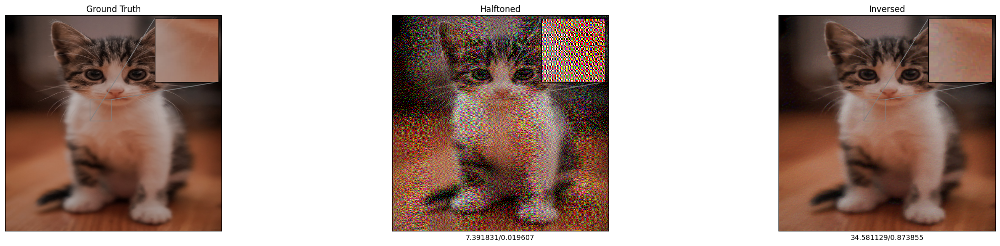

In [15]:
image_size = 512
amount = 0.7

test(amount, model, '/content/photo-1615789591457-74a63395c990.jpeg')

<ipython-input-14-f61c288948f5>:135: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  axes[j].set_xlabel('%f/%f' % (psnr(images[0], image, data_range=255),ssim(images[0], image, data_range=255, multichannel=True)))
<ipython-input-14-f61c288948f5>:145: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


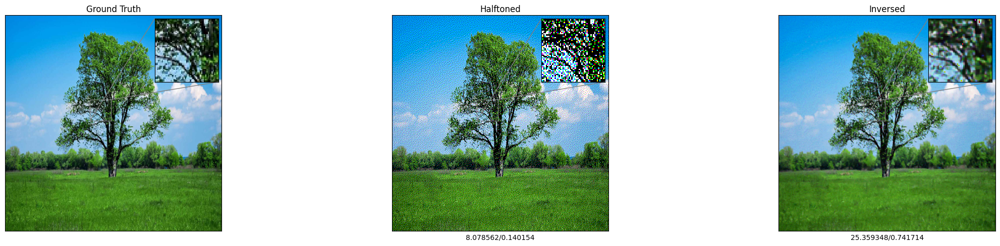

In [16]:
image_size = 512
amount = 0.7

test(amount, model, '/content/the-difference-between-trees-and-shrubs-3269804-hero-a4000090f0714f59a8ec6201ad250d90.jpg')